In [1]:
# Importaciones necesarias
from IPython.display import Image     # Import the Image function from IPython.display to display images in Jupyter environments.
from os import chdir                  # Import chdir from os module to change the current working directory.
from scipy.spatial import Delaunay    # Import Delaunay
import numpy as np                    # Import numpy library for working with n-dimensional arrays and mathematical operations.
import gudhi as gd                    # Import gudhi library for computational topology and computational geometry.
import matplotlib.pyplot as plt       # Import pyplot from matplotlib for creating visualizations and graphs.
import argparse                       # Import argparse, a standard library for writing user-friendly command-line interfaces.
import seaborn as sns                 # Import seaborn for data visualization; it's based on matplotlib and provides a high-level interface for drawing statistical graphs.
import requests                       # Import requests library to make HTTP requests in Python easily.
import pandas as pd                   # Import pandas for data manipulation and analysis.
from scipy.spatial.distance import pdist, squareform  # Import distance functions from scipy.spatial.distance
import os
from os import path, makedirs
from scipy.spatial import Voronoi, voronoi_plot_2d, Delaunay, delaunay_plot_2d
from alphashape import alphashape

In [2]:
import os
import requests
import csv
#Ruta del directorio que contiene los archivos CSV
ruta_directorio = "/home/jupyter-user5/multicellularity_patterns_classification-/datos_c"

# Obtener una lista de todos los archivos CSV en la ruta especificada
archivos_csv = [archivo for archivo in os.listdir(ruta_directorio) if archivo.endswith('.csv')]

# Iterar sobre cada archivo CSV
for archivo_csv in archivos_csv:
    # Construir la ruta completa del archivo
    ruta_completa = os.path.join(ruta_directorio, archivo_csv)
    
    # Leer el archivo CSV y asignar nombres de columnas
    df = pd.read_csv(ruta_completa, header=None)
    nombres_columnas = ['id', 'X', 'Y',  'Tipo']  # Reemplazar con los nombres de columnas apropiados
    df.columns = nombres_columnas
    
    # Mostrar las primeras filas del DataFrame
    print("Contenido de", archivo_csv)
    print(df.head(5))
    
    # Contar el número de IDs distintos
    num_ids_distintos = df['id'].nunique()
    print("Número de IDs distintos:", num_ids_distintos)

# Obtener una lista de fenotipos únicos
    fenotipos_unicos = df['Tipo'].unique().tolist()
    print("Fenotipos únicos:", fenotipos_unicos)

Contenido de high_grade_dysplasia.csv
       id            X            Y              Tipo
0  CellID   X_centroid   Y_centroid         phenotype
1      28  15954.03297  10809.96703  non-immune cells
2     103  15728.93023  9802.246238       tumor cells
3     141  15872.66042  10464.04583  non-immune cells
4     193  16304.46779  10769.14976       tumor cells
Número de IDs distintos: 2311
Fenotipos únicos: ['phenotype', 'non-immune cells', 'tumor cells', 'M1 type macrophage', 'CD4 T cells', 'likely-NKT cells', 'dendritic cells', 'CD8 T cells', 'NKT cells', 'B cells', 'T cells']
Contenido de low_grade_dysplasia.csv
       id            X            Y              Tipo
0  CellID   X_centroid   Y_centroid         phenotype
1      87  14793.98923  8843.229803       CD8 T cells
2     186  15204.70638  8889.964765  non-immune cells
3     208  14862.13941  9015.434316       CD4 T cells
4     274   15083.8345  8601.980365       CD8 T cells
Número de IDs distintos: 1265
Fenotipos únicos: ['phen

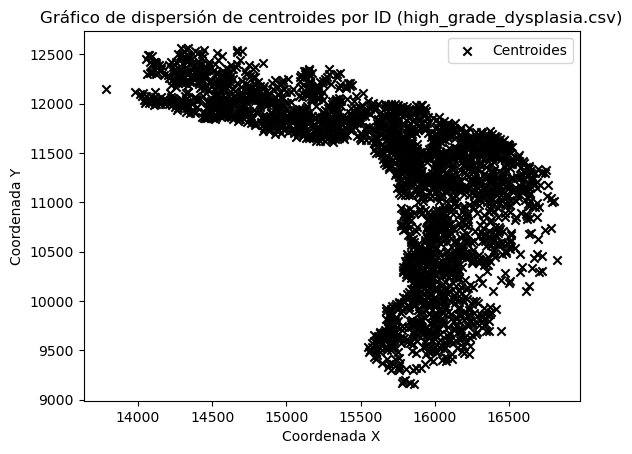

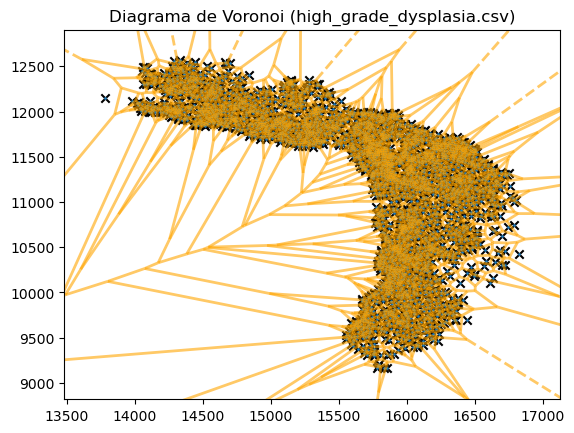

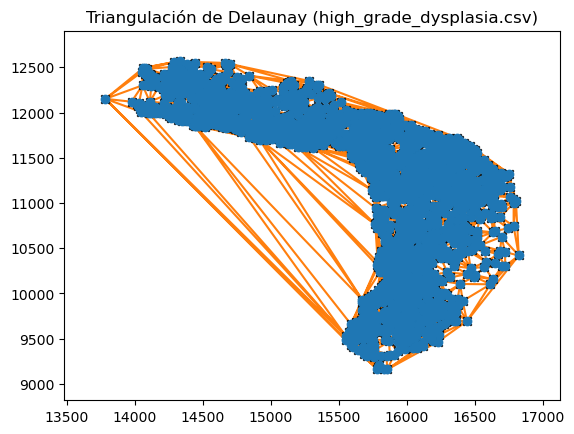

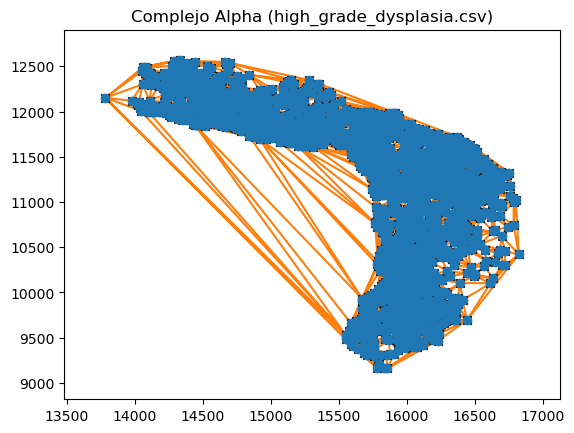

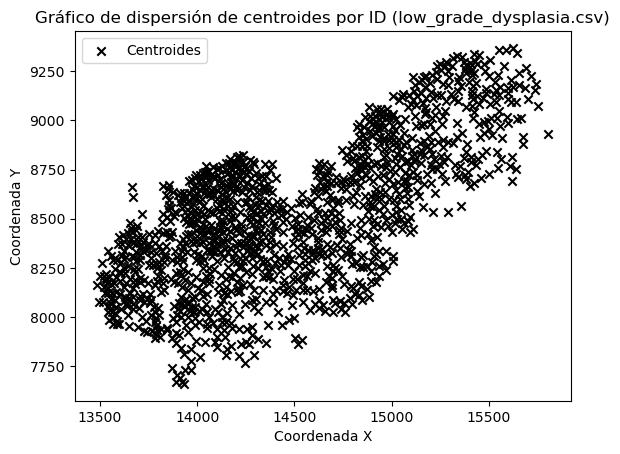

...

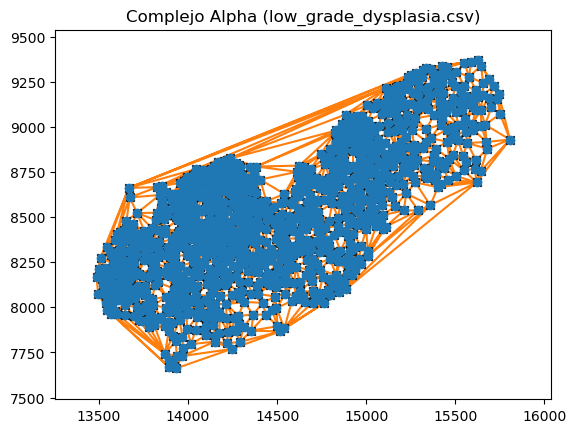

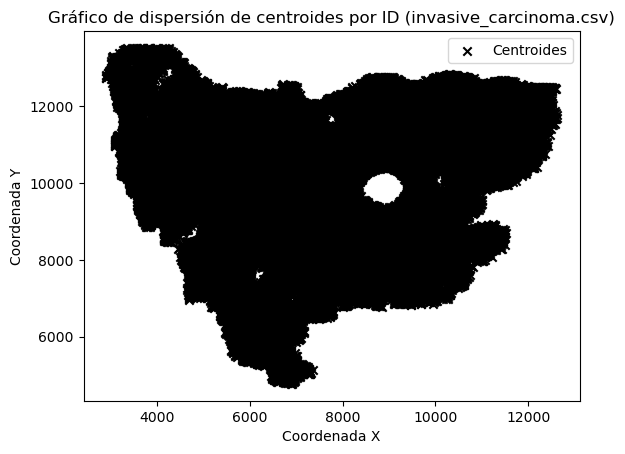

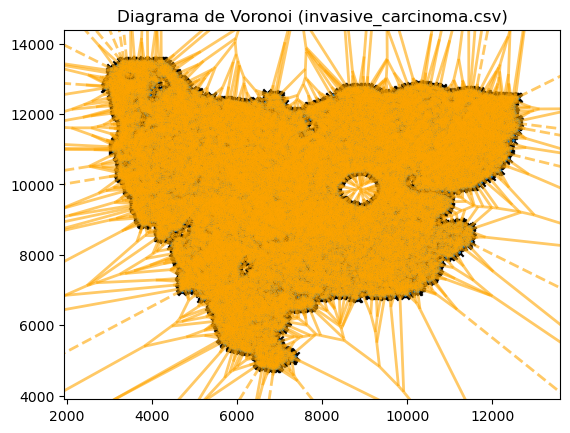

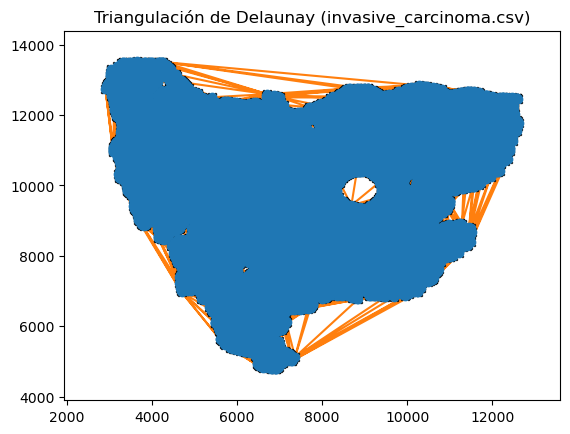

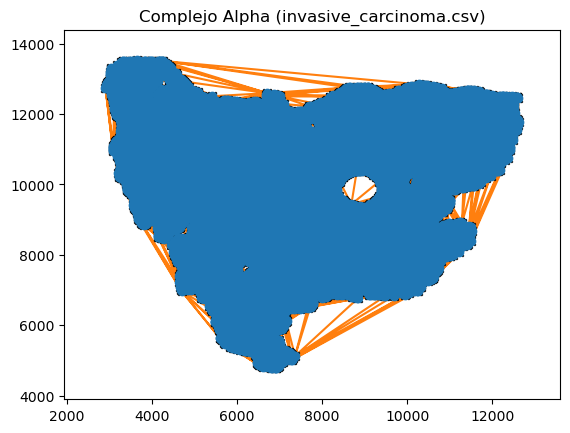

In [3]:
# Ruta del directorio que contiene los archivos CSV
ruta_directorio = "/home/jupyter-user5/multicellularity_patterns_classification-/datos_c"
archivos_csv = [archivo for archivo in os.listdir(ruta_directorio) if archivo.endswith('.csv')]

# Crear la carpeta para las imágenes si no existe
output_dir = "Datos_im"
os.makedirs(output_dir, exist_ok=True)

# Iterar sobre cada archivo CSV
for archivo_csv in archivos_csv:
    # Construir la ruta completa del archivo
    ruta_completa = os.path.join(ruta_directorio, archivo_csv)
    
    # Leer el archivo CSV con los nombres de columnas ya definidos
    df = pd.read_csv(ruta_completa)
    
    # Extraer las coordenadas de los centroides
    centroides_x = df['X_centroid']
    centroides_y = df['Y_centroid']
    
    # Crear el gráfico de dispersión solo con los centroides
    plt.scatter(centroides_x, centroides_y, color='black', marker='x', label='Centroides')
    plt.xlabel('Coordenada X')
    plt.ylabel('Coordenada Y')
    plt.title(f'Gráfico de dispersión de centroides por ID ({archivo_csv})')
    plt.legend()
    plt.show()
    
    # Generar los diagramas para los centroides
    points = np.column_stack((centroides_x, centroides_y))
    
    # Diagrama de Voronoi
    vor = Voronoi(points)
    fig, ax = plt.subplots()
    voronoi_plot_2d(vor, ax=ax, show_vertices=False, line_colors='orange', line_width=2, line_alpha=0.6, point_size=2)
    plt.scatter(centroides_x, centroides_y, color='black', marker='x')
    plt.title(f'Diagrama de Voronoi ({archivo_csv})')
    plt.savefig(os.path.join(output_dir, f'diagrama_voronoi_{os.path.basename(archivo_csv)}.png'))
    plt.show()

    # Triangulación de Delaunay
    delaunay_tri = Delaunay(points)
    fig, ax = plt.subplots()
    delaunay_plot_2d(delaunay_tri, ax=ax)
    plt.scatter(centroides_x, centroides_y, color='black', marker='x')
    plt.title(f'Triangulación de Delaunay ({archivo_csv})')
    plt.savefig(os.path.join(output_dir, f'triangulacion_delaunay_{os.path.basename(archivo_csv)}.png'))
    plt.show()

    # Complejo Alpha (aproximación con Delaunay)
    fig, ax = plt.subplots()
    delaunay_plot_2d(delaunay_tri, ax=ax)
    plt.scatter(centroides_x, centroides_y, color='black', marker='x')
    plt.title(f'Complejo Alpha ({archivo_csv})')
    plt.savefig(os.path.join(output_dir, f'complejo_alpha_{os.path.basename(archivo_csv)}.png'))
    plt.show()

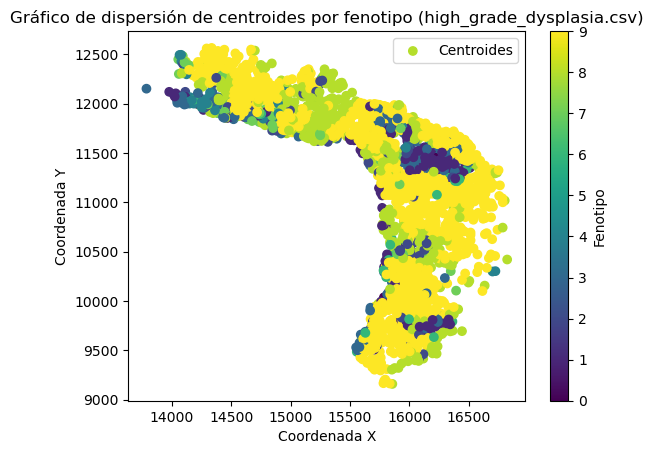

usetex mode requires TeX.


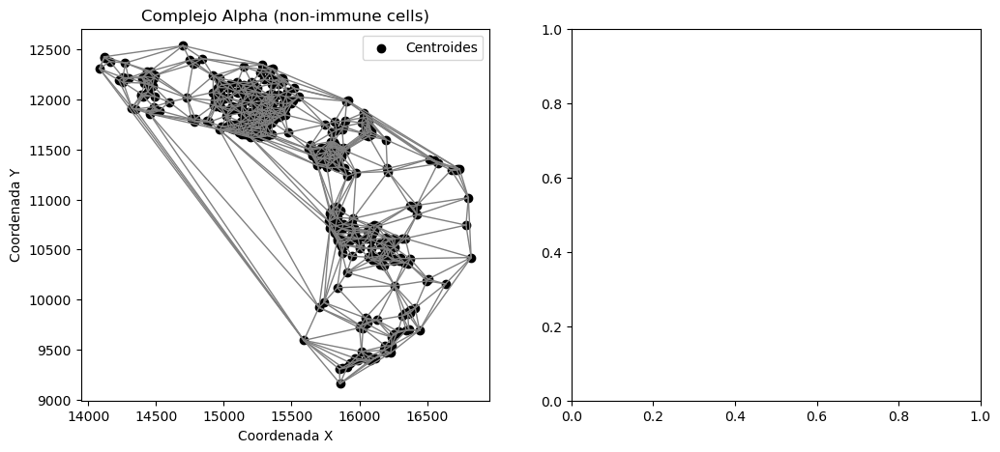

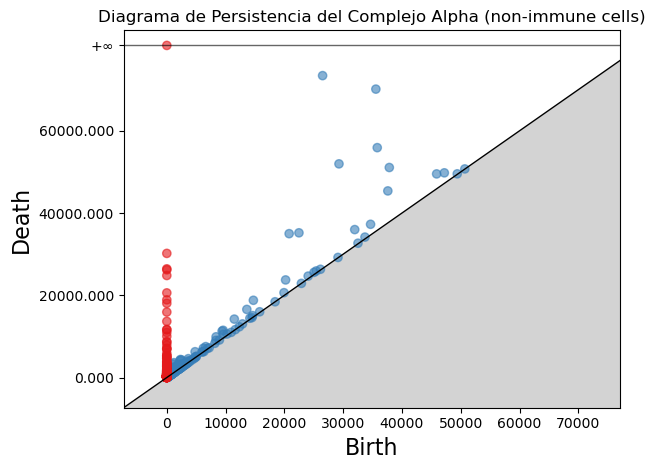

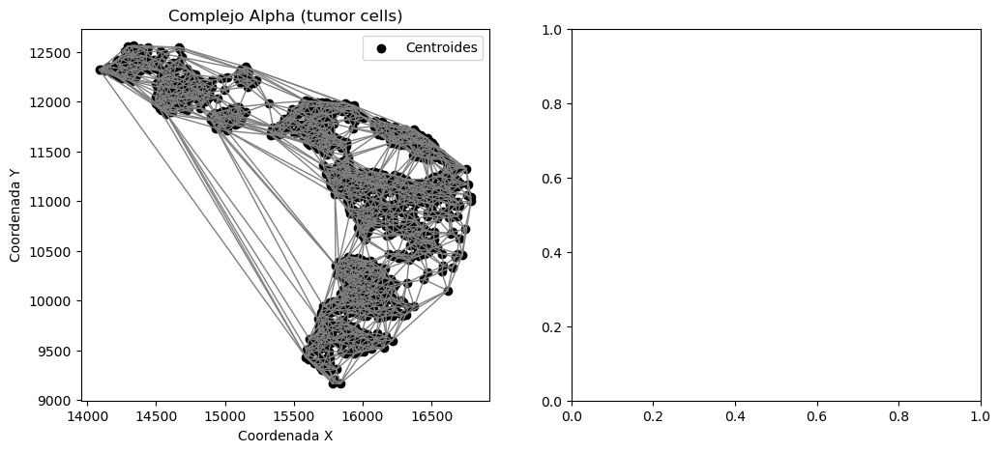

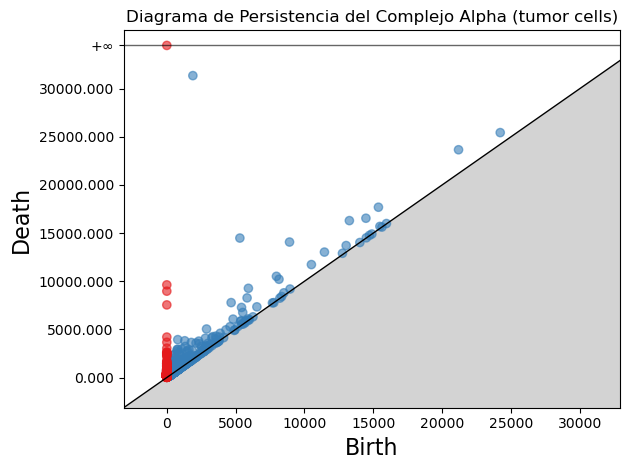

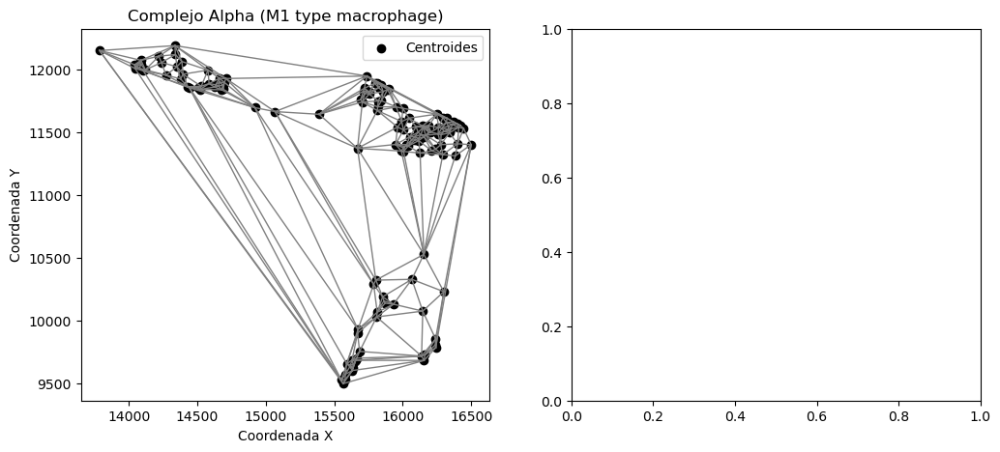

...

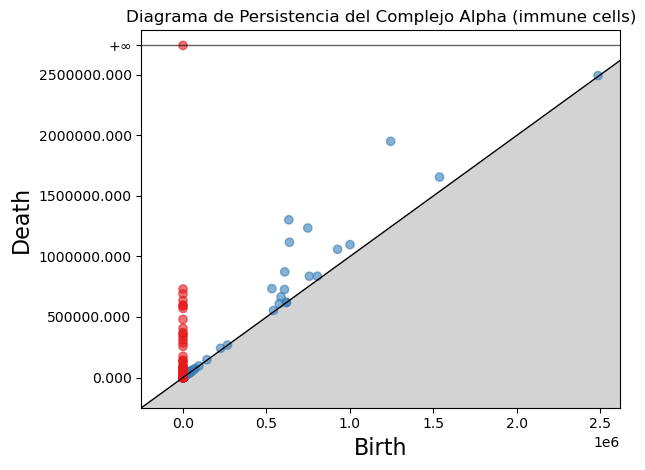

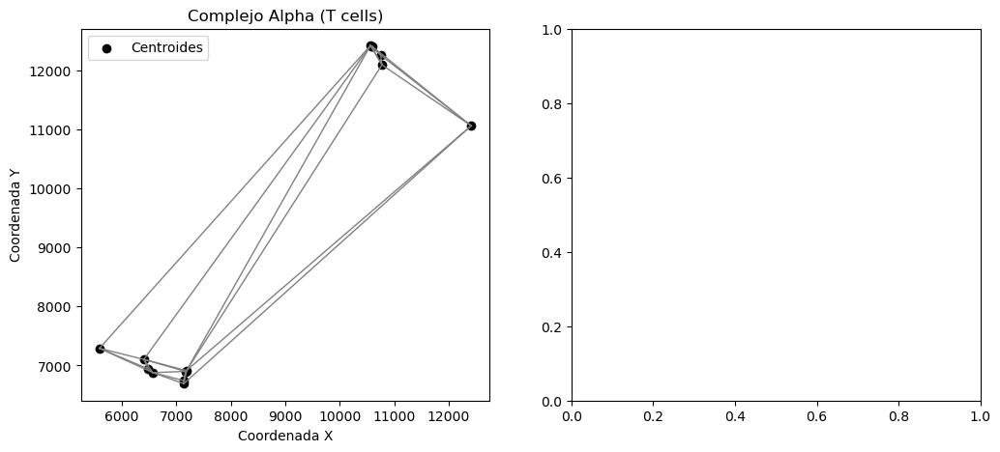

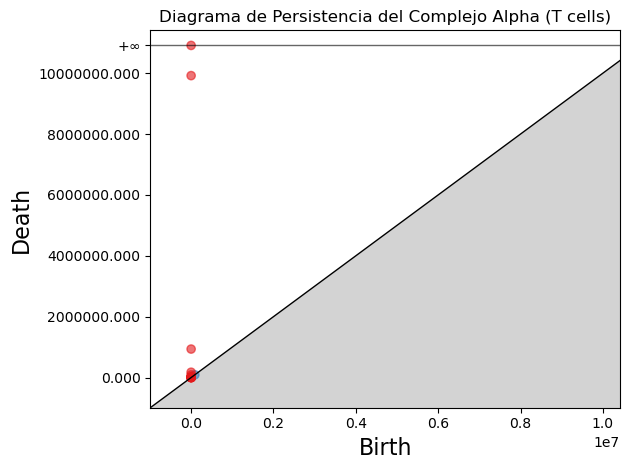

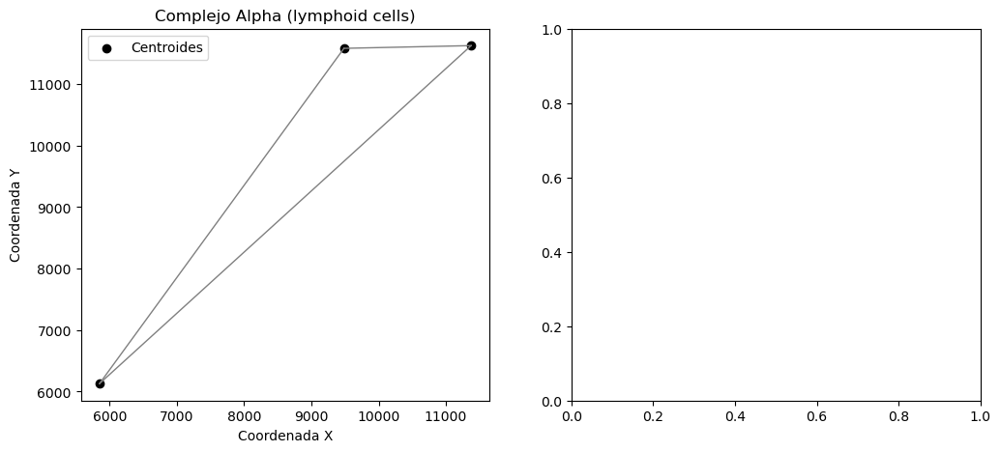

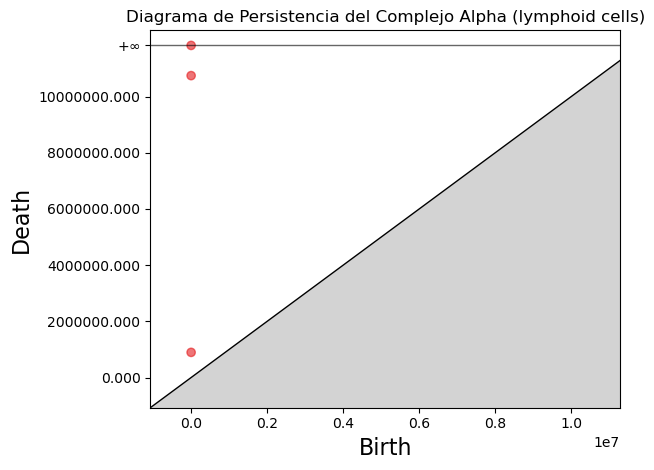

Distancia de Bottleneck (Dimensión 1) para high_grade_dysplasia.csv_non-immune cells es efectivamente cero.
Distancia de Bottleneck (Dimensión 0) para high_grade_dysplasia.csv_non-immune cells es efectivamente cero.
Distancia de Bottleneck (Dimensión 1) para high_grade_dysplasia.csv_tumor cells es efectivamente cero.
Distancia de Bottleneck (Dimensión 0) para high_grade_dysplasia.csv_tumor cells es efectivamente cero.
Distancia de Bottleneck (Dimensión 1) para high_grade_dysplasia.csv_M1 type macrophage es efectivamente cero.
Distancia de Bottleneck (Dimensión 0) para high_grade_dysplasia.csv_M1 type macrophage es efectivamente cero.
Distancia de Bottleneck (Dimensión 1) para high_grade_dysplasia.csv_CD4 T cells es efectivamente cero.
Distancia de Bottleneck (Dimensión 0) para high_grade_dysplasia.csv_CD4 T cells es efectivamente cero.
Distancia de Bottleneck (Dimensión 1) para high_grade_dysplasia.csv_likely-NKT cells es efectivamente cero.
Distancia de Bottleneck (Dimensión 0) para h

In [4]:
# Ruta del directorio que contiene los archivos CSV
ruta_directorio = "/home/jupyter-user5/multicellularity_patterns_classification-/datos_c"

# Obtener una lista de todos los archivos CSV en la ruta especificada
archivos_csv = [archivo for archivo in os.listdir(ruta_directorio) if archivo.endswith('.csv')]

# Diccionarios para almacenar los diagramas de persistencia
diagramas_persistencia = {}
diagramas_persistencia_0 = {}

# Iterar sobre cada archivo CSV
for archivo_csv in archivos_csv:
    # Construir la ruta completa del archivo
    ruta_completa = os.path.join(ruta_directorio, archivo_csv)
    
    # Leer el archivo CSV
    df = pd.read_csv(ruta_completa)
    
    # Extraer las coordenadas de los centroides y fenotipos
    centroides_x = df['X_centroid']
    centroides_y = df['Y_centroid']
    tipos_centroides = df['phenotype']
    
    # Crear el gráfico de dispersión solo con los centroides
    plt.scatter(centroides_x, centroides_y, c=tipos_centroides.astype('category').cat.codes, cmap='viridis', label='Centroides')
    plt.xlabel('Coordenada X')
    plt.ylabel('Coordenada Y')
    plt.title(f'Gráfico de dispersión de centroides por fenotipo ({archivo_csv})')
    plt.colorbar(label='Fenotipo')
    plt.legend()
    plt.show()

    # Filtrar por cada fenotipo
    for fenotipo in tipos_centroides.unique():
        df_filtro = df[df['phenotype'] == fenotipo]
        puntos = np.array(list(zip(df_filtro['X_centroid'], df_filtro['Y_centroid'])))

        # Calcular el complejo Alpha
        alpha_complex = gd.AlphaComplex(points=puntos)
        simplex_tree = alpha_complex.create_simplex_tree()

        # Visualizar el complejo Alpha
        plt.figure(figsize=(12, 5))

        plt.subplot(1, 2, 1)
        plt.scatter(df_filtro['X_centroid'], df_filtro['Y_centroid'], color='black', label='Centroides')
        for simplex in simplex_tree.get_skeleton(1):  # Obtener las aristas
            if len(simplex[0]) == 2:  # Asegurarse de que solo sean aristas
                arista = simplex[0]
                x = [df_filtro['X_centroid'].iloc[i] for i in arista]
                y = [df_filtro['Y_centroid'].iloc[i] for i in arista]
                plt.plot(x, y, color='gray', linestyle='-', linewidth=1)
        plt.xlabel('Coordenada X')
        plt.ylabel('Coordenada Y')
        plt.title(f'Complejo Alpha ({fenotipo})')
        plt.legend()

        # Calcular el diagrama de persistencia
        diag = simplex_tree.persistence()

        # Guardar el diagrama de persistencia
        diagramas_persistencia[f"{archivo_csv}_{fenotipo}"] = simplex_tree.persistence_intervals_in_dimension(1)
        diagramas_persistencia_0[f"{archivo_csv}_{fenotipo}"] = simplex_tree.persistence_intervals_in_dimension(0)

        # Mostrar el diagrama de persistencia
        plt.subplot(1, 2, 2)
        gd.plot_persistence_diagram(diag)
        plt.title(f'Diagrama de Persistencia del Complejo Alpha ({fenotipo})')
        plt.xlabel('Birth')
        plt.ylabel('Death')
        plt.tight_layout()
        plt.show()

# Calcular las distancias de Bottleneck entre todos los pares de diagramas de persistencia
archivos = list(diagramas_persistencia.keys())
n = len(archivos)
tolerancia = 1e-10  # Tolerancia para considerar distancias efectivamente como cero

# Inicializar matrices de distancias
distancias_dim1 = np.zeros((n, n))
distancias_dim0 = np.zeros((n, n))

for i in range(n):
    for j in range(i, n):
        archivo_i = archivos[i]
        archivo_j = archivos[j]
        diag_i = diagramas_persistencia[archivo_i]
        diag_j = diagramas_persistencia[archivo_j]
        diag_i_0 = diagramas_persistencia_0[archivo_i]
        diag_j_0 = diagramas_persistencia_0[archivo_j]
        
        distancia_bottleneck = gd.bottleneck_distance(diag_i, diag_j)
        distancia_bottleneck_0 = gd.bottleneck_distance(diag_i_0, diag_j_0)
        
        distancias_dim1[i, j] = distancia_bottleneck
        distancias_dim1[j, i] = distancia_bottleneck
        distancias_dim0[i, j] = distancia_bottleneck_0
        distancias_dim0[j, i] = distancia_bottleneck_0
        
        # Verificar que la distancia de Bottleneck para el mismo archivo es efectivamente cero
        if i == j:
            if distancia_bottleneck < tolerancia:
                print(f"Distancia de Bottleneck (Dimensión 1) para {archivo_i} es efectivamente cero.")
            else:
                print(f"Distancia de Bottleneck (Dimensión 1) para {archivo_i} no es cero: {distancia_bottleneck}")
            
            if distancia_bottleneck_0 < tolerancia:
                print(f"Distancia de Bottleneck (Dimensión 0) para {archivo_i} es efectivamente cero.")
            else:
                print(f"Distancia de Bottleneck (Dimensión 0) para {archivo_i} no es cero: {distancia_bottleneck_0}")

# Imprimir las matrices de distancias
print("Matriz de distancias de Bottleneck (Dimensión 1):")
print(distancias_dim1)

print("Matriz de distancias de Bottleneck (Dimensión 0):")
print(distancias_dim0)

In [7]:
# Visualizar las matrices de distancias como heatmaps y clustermaps
def plot_heatmap_and_clustermap(matrix, title):
    plt.figure(figsize=(10, 8))
    sns.heatmap(matrix, xticklabels=archivos, yticklabels=archivos, cmap='viridis', annot=True,fmt=".2f", annot_kws={"size": 3})
    plt.title(f"Heatmap de {title}")
    plt.show()

    sns.clustermap(matrix, xticklabels=archivos, yticklabels=archivos, cmap='viridis', annot=True,fmt=".2f", annot_kws={"size": 3})
    plt.title(f"Clustermap de {title}")
    plt.show()

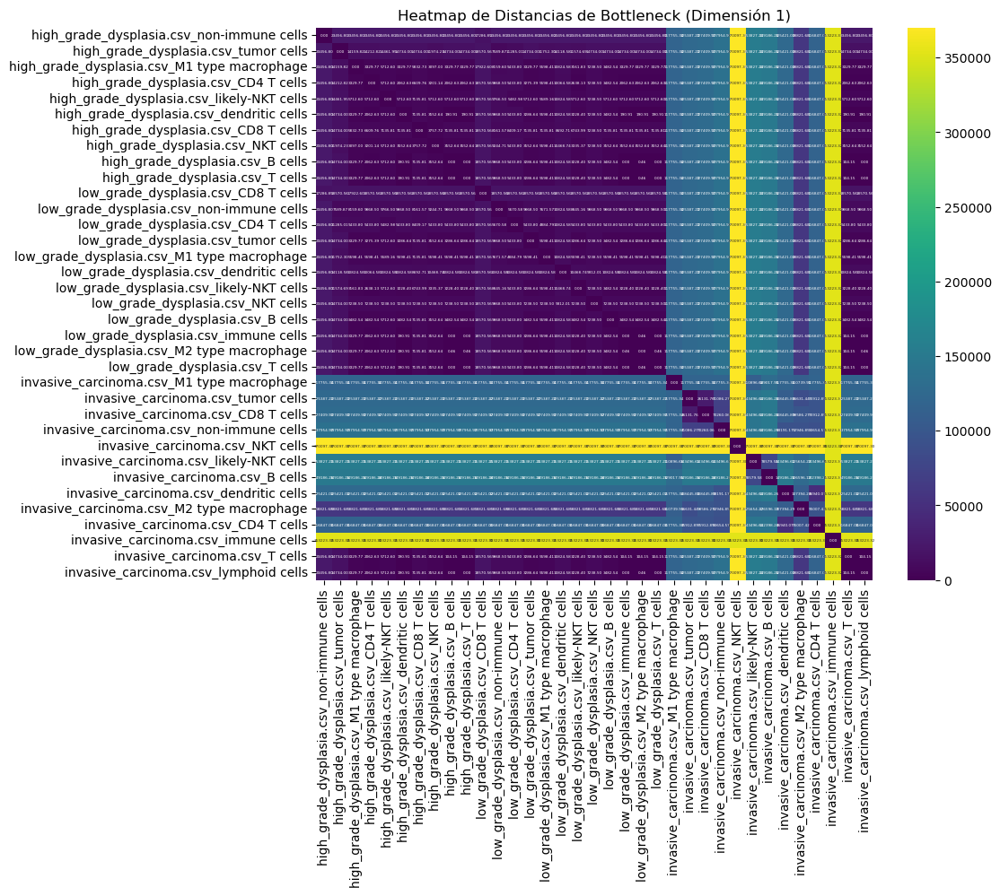

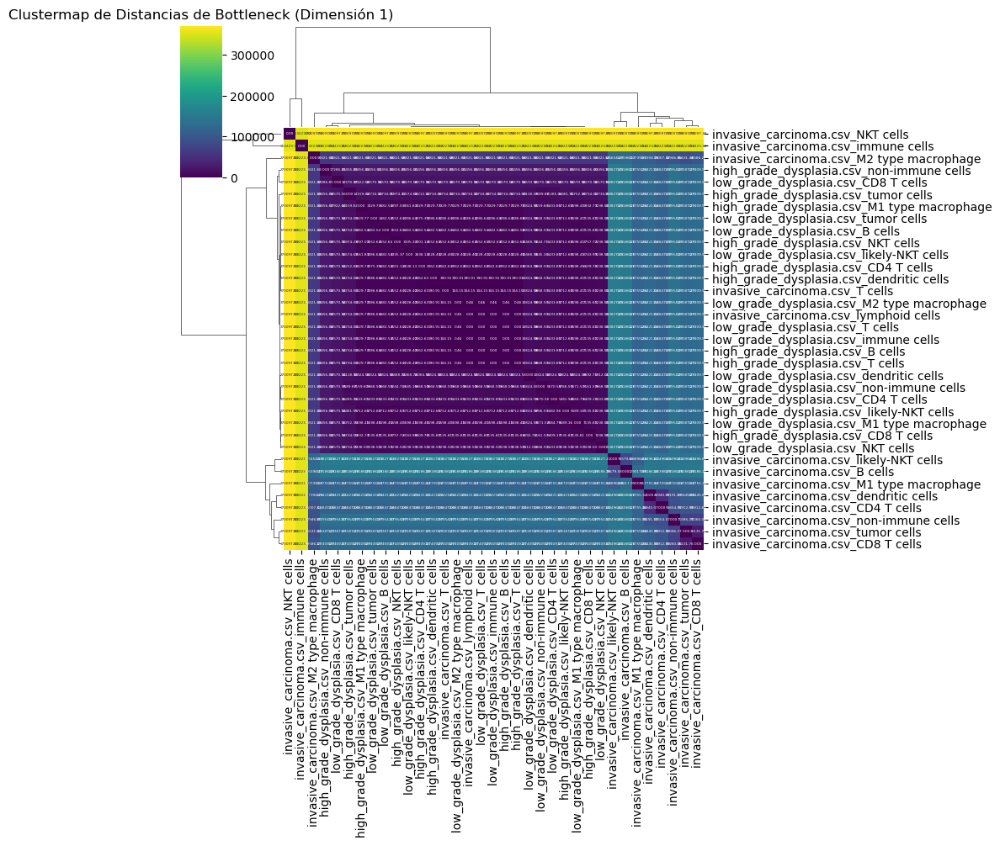

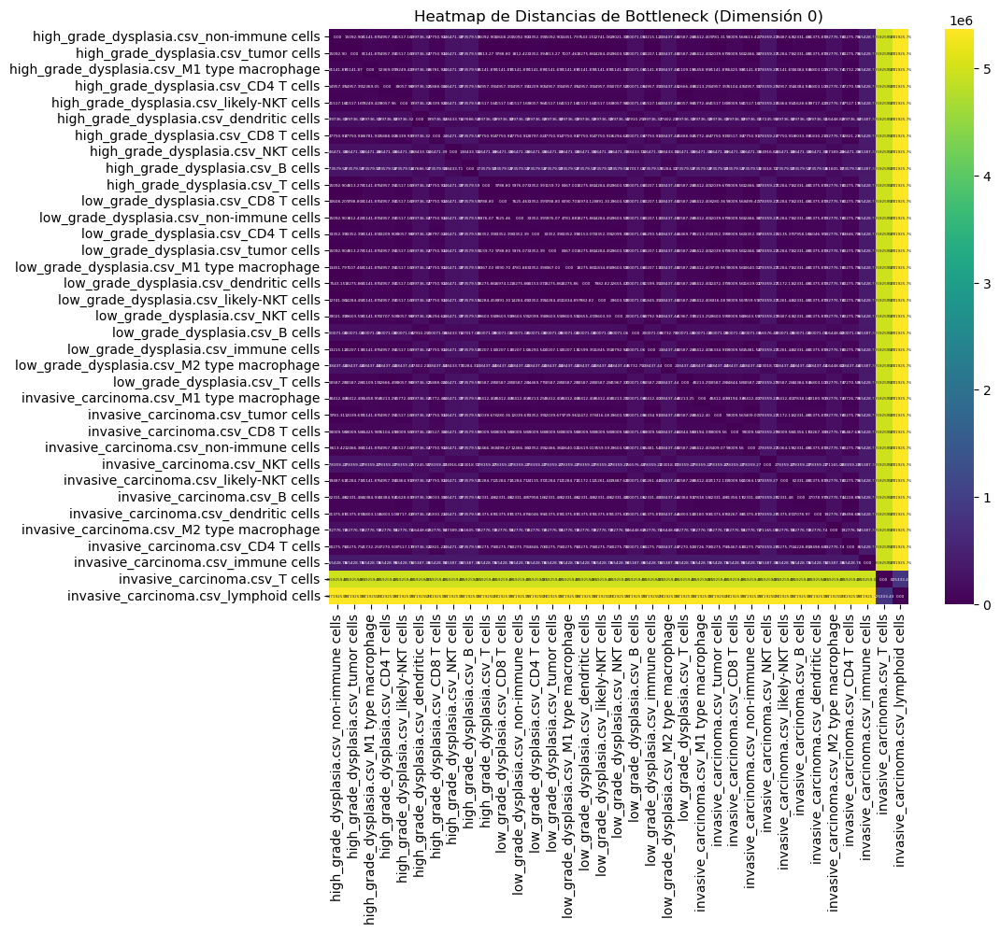

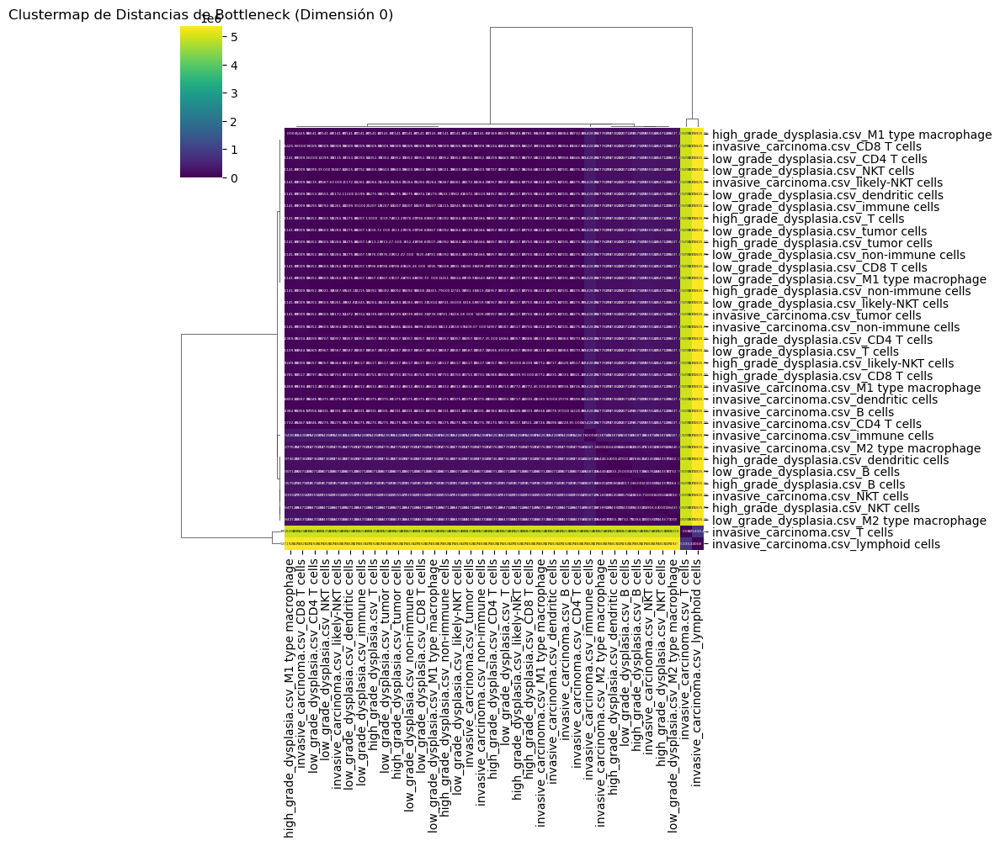

In [8]:
plot_heatmap_and_clustermap(distancias_dim1, "Distancias de Bottleneck (Dimensión 1)")
plot_heatmap_and_clustermap(distancias_dim0, "Distancias de Bottleneck (Dimensión 0)")

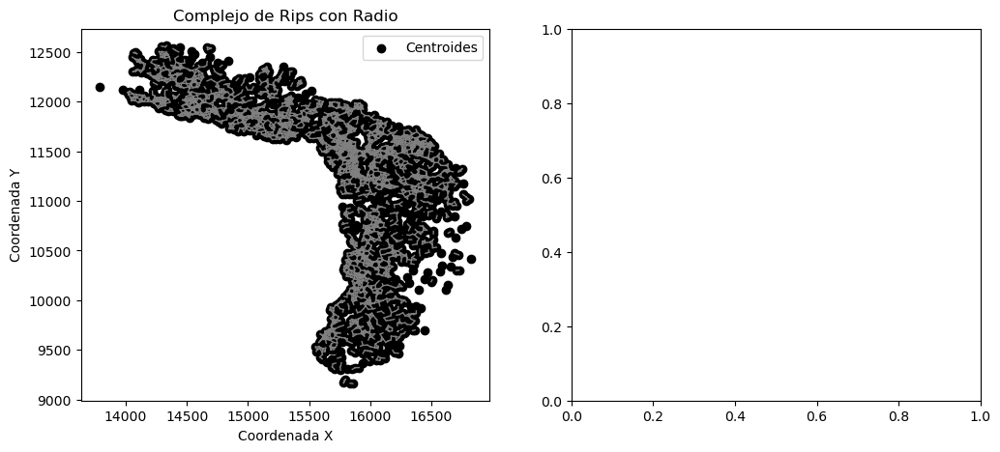

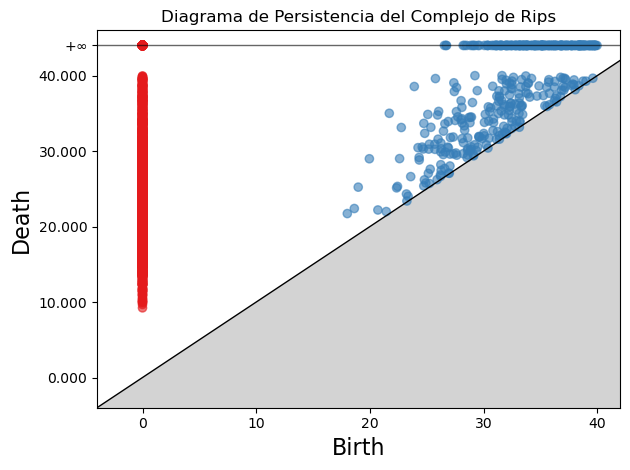

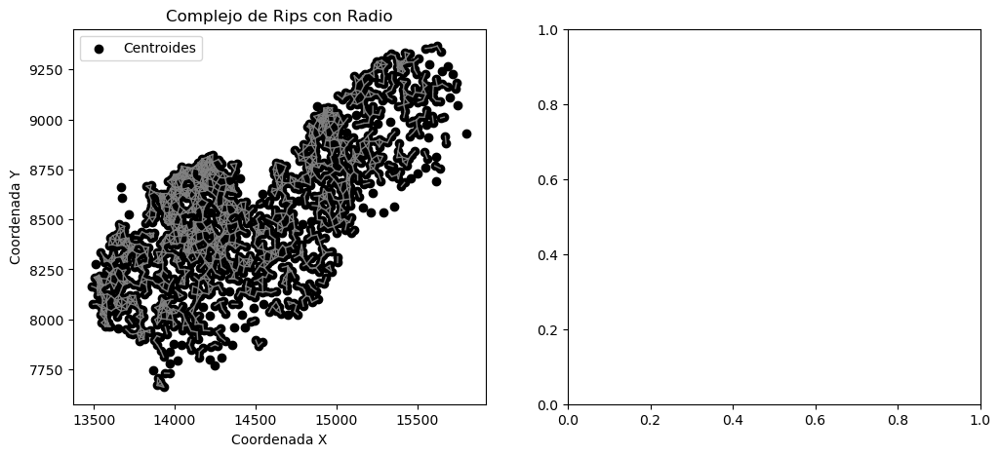

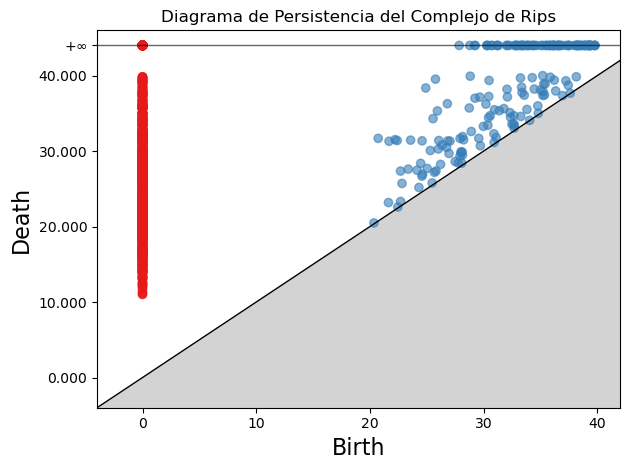

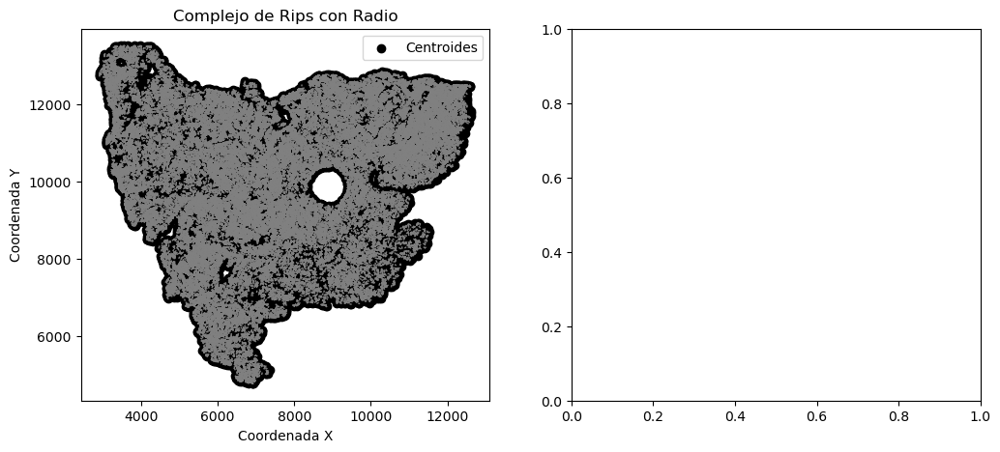

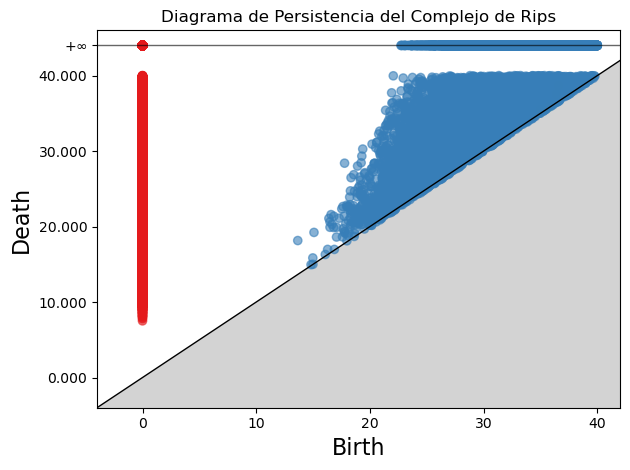

In [9]:


# Ruta del directorio que contiene los archivos CSV
ruta_directorio = "/home/jupyter-user5/multicellularity_patterns_classification-/datos_c"

# Obtener una lista de todos los archivos CSV en la ruta especificada
archivos_csv = [archivo for archivo in os.listdir(ruta_directorio) if archivo.endswith('.csv')]

# Iterar sobre cada archivo CSV
for archivo_csv in archivos_csv:
    # Construir la ruta completa del archivo
    ruta_completa = os.path.join(ruta_directorio, archivo_csv)
    
    # Leer el archivo CSV y asignar nombres de columnas
    df = pd.read_csv(ruta_completa)
    nombres_columnas = ['CellID', 'X_centroid', 'Y_centroid', 'phenotype']
    df.columns = nombres_columnas
    
    # Extraer las coordenadas de los centroides
    X = df['X_centroid'].values
    Y = df['Y_centroid'].values
    
    # Convertir las coordenadas de los centroides a un formato adecuado para gudhi
    puntos = np.array(list(zip(X, Y)))

    # Calcular el complejo de Rips con un radio específico
    rips_complex = gd.RipsComplex(points=puntos, max_edge_length=40)
    simplex_tree = rips_complex.create_simplex_tree(max_dimension=3)

    # Visualizar el complejo de Rips
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.scatter(X, Y, color='black', label='Centroides')
    for simplex in simplex_tree.get_skeleton(1):  # Obtener las aristas
        if len(simplex[0]) == 2:  # Asegurarse de que solo sean aristas
            arista = simplex[0]
            x = [X[i] for i in arista]
            y = [Y[i] for i in arista]
            plt.plot(x, y, color='gray', linestyle='-', linewidth=1)
    plt.xlabel('Coordenada X')
    plt.ylabel('Coordenada Y')
    plt.title('Complejo de Rips con Radio')
    plt.legend()

    # Calcular el diagrama de persistencia
    diag = simplex_tree.persistence()

    # Mostrar el diagrama de dispersión de persistencia
    plt.subplot(1, 2, 2)
    gd.plot_persistence_diagram(diag)
    plt.title('Diagrama de Persistencia del Complejo de Rips')
    plt.xlabel('Birth')
    plt.ylabel('Death')

    plt.tight_layout()
    plt.show()


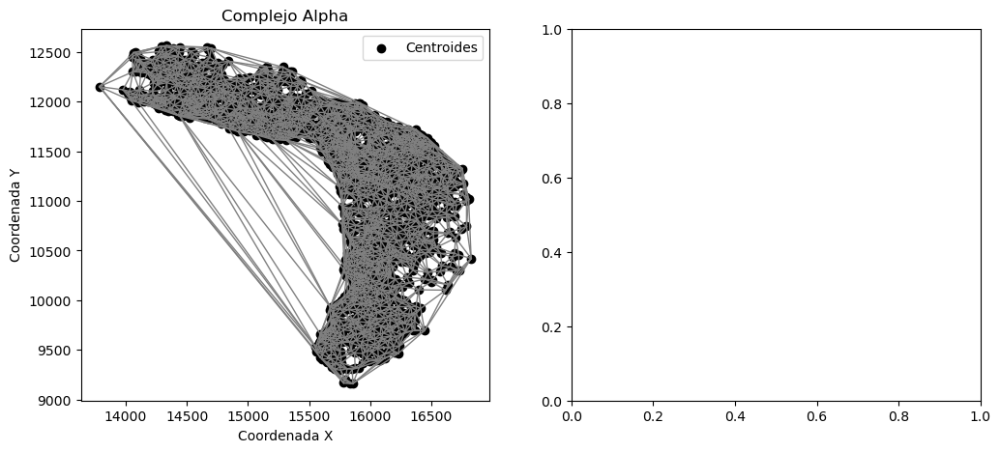

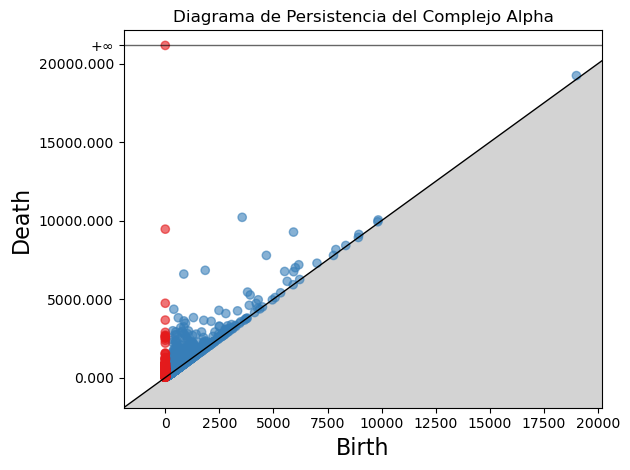

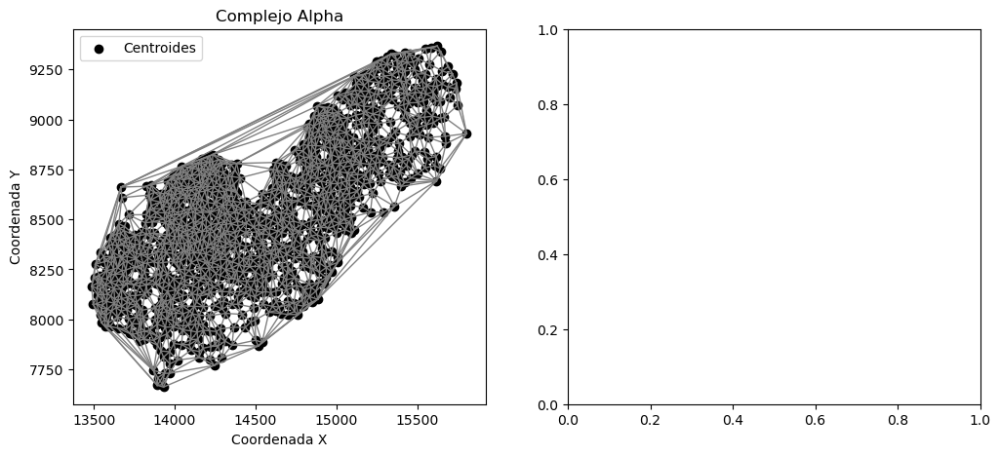

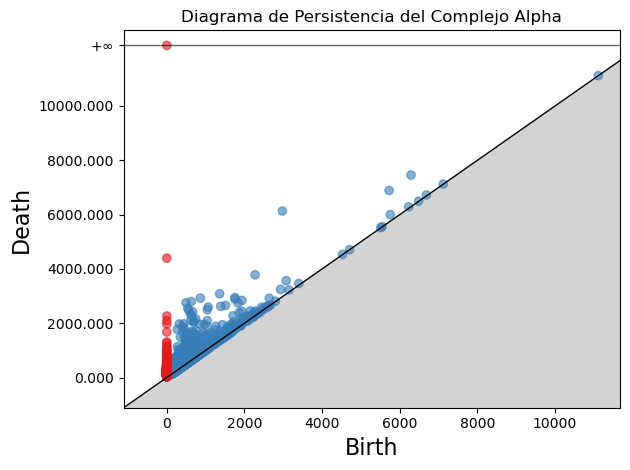

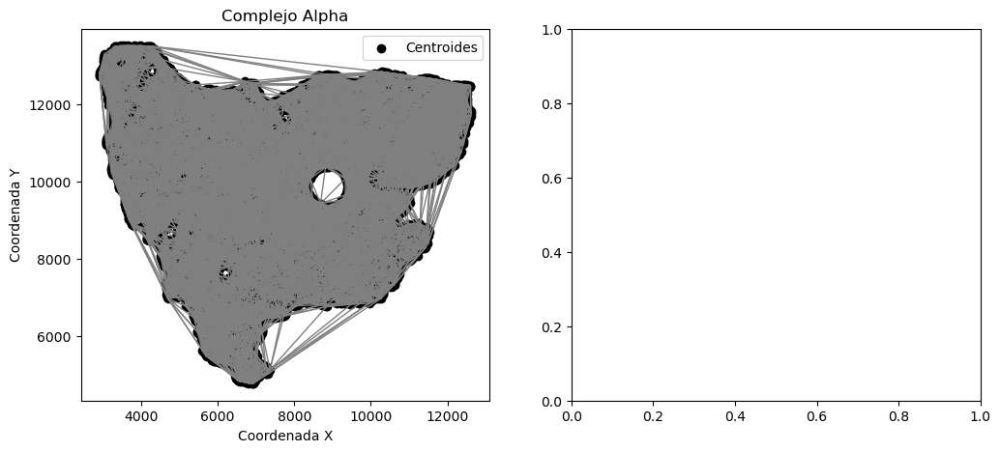

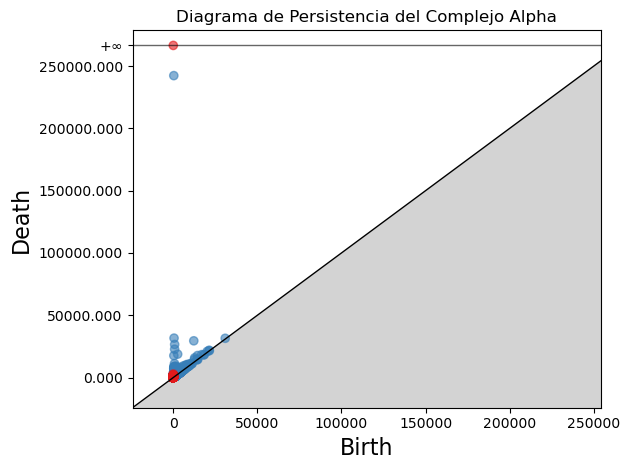

Distancia de Bottleneck (Dimensión 1) para high_grade_dysplasia.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 0) para high_grade_dysplasia.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 1) para low_grade_dysplasia.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 0) para low_grade_dysplasia.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 1) para invasive_carcinoma.csv es efectivamente cero.
Distancia de Bottleneck (Dimensión 0) para invasive_carcinoma.csv es efectivamente cero.
Matriz de distancias de Bottleneck (Dimensión 1):
[[7.93792328e-309 2.75200524e+003 1.21006087e+005]
 [2.75200524e+003 5.07871619e-309 1.21006087e+005]
 [1.21006087e+005 1.21006087e+005 4.08581055e-309]]
Matriz de distancias de Bottleneck (Dimensión 0):
[[7.85230782e-309 4.72727907e+003 4.72727907e+003]
 [4.72727907e+003 1.14398933e-308 1.56241031e+003]
 [4.72727907e+003 1.56241031e+003 1.28068956e-308]]


In [13]:
# Obtener una lista de todos los archivos CSV en la ruta especificada
archivos_csv = [archivo for archivo in os.listdir(ruta_directorio) if archivo.endswith('.csv')]

# Definir los nombres de columnas esperados en los archivos CSV
nombres_columnas = ['CellID', 'X_centroid', 'Y_centroid', 'phenotype']

# Diccionarios para almacenar los diagramas de persistencia
diagramas_persistencia = {}
diagramas_persistencia_0 = {}

# Iterar sobre cada archivo CSV
for archivo_csv in archivos_csv:
    # Construir la ruta completa del archivo
    ruta_completa = os.path.join(ruta_directorio, archivo_csv)

    # Leer el archivo CSV y asignar nombres de columnas
    df = pd.read_csv(ruta_completa)
    df.columns = nombres_columnas

    # Extraer las coordenadas de los centroides
    X = df['X_centroid'].values
    Y = df['Y_centroid'].values

    # Convertir las coordenadas de los centroides a un formato adecuado para Gudhi
    puntos = np.array(list(zip(X, Y)))

    # Calcular el complejo Alpha
    alpha_complex = gd.AlphaComplex(points=puntos)
    simplex_tree = alpha_complex.create_simplex_tree()

    # Visualizar el complejo Alpha
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.scatter(X, Y, color='black', label='Centroides')
    for simplex in simplex_tree.get_skeleton(1):  # Obtener las aristas
        if len(simplex[0]) == 2:  # Asegurarse de que solo sean aristas
            arista = simplex[0]
            x = [X[i] for i in arista]
            y = [Y[i] for i in arista]
            plt.plot(x, y, color='gray', linestyle='-', linewidth=1)
    plt.xlabel('Coordenada X')
    plt.ylabel('Coordenada Y')
    plt.title('Complejo Alpha')
    plt.legend()

    # Calcular el diagrama de persistencia
    diag = simplex_tree.persistence()

    # Guardar el diagrama de persistencia
    diagramas_persistencia[archivo_csv] = simplex_tree.persistence_intervals_in_dimension(1)
    diagramas_persistencia_0[archivo_csv] = simplex_tree.persistence_intervals_in_dimension(0)

    # Mostrar el diagrama de persistencia
    plt.subplot(1, 2, 2)
    gd.plot_persistence_diagram(diag)
    plt.title('Diagrama de Persistencia del Complejo Alpha')
    plt.xlabel('Birth')
    plt.ylabel('Death')
    plt.tight_layout()
    plt.show()

# Calcular las distancias de Bottleneck entre todos los pares de diagramas de persistencia
archivos = list(diagramas_persistencia.keys())
n = len(archivos)
tolerancia = 1e-10  # Tolerancia para considerar distancias efectivamente como cero

# Inicializar matrices de distancias
distancias_dim1 = np.zeros((n, n))
distancias_dim0 = np.zeros((n, n))

for i in range(n):
    for j in range(i, n):
        archivo_i = archivos[i]
        archivo_j = archivos[j]
        diag_i = diagramas_persistencia[archivo_i]
        diag_j = diagramas_persistencia[archivo_j]
        diag_i_0 = diagramas_persistencia_0[archivo_i]
        diag_j_0 = diagramas_persistencia_0[archivo_j]

        distancia_bottleneck = gd.bottleneck_distance(diag_i, diag_j)
        distancia_bottleneck_0 = gd.bottleneck_distance(diag_i_0, diag_j_0)

        distancias_dim1[i, j] = distancia_bottleneck
        distancias_dim1[j, i] = distancia_bottleneck
        distancias_dim0[i, j] = distancia_bottleneck_0
        distancias_dim0[j, i] = distancia_bottleneck_0

        # Verificar que la distancia de Bottleneck para el mismo archivo es efectivamente cero
        if i == j:
            if distancia_bottleneck < tolerancia:
                print(f"Distancia de Bottleneck (Dimensión 1) para {archivo_i} es efectivamente cero.")
            else:
                print(f"Distancia de Bottleneck (Dimensión 1) para {archivo_i} no es cero: {distancia_bottleneck}")

            if distancia_bottleneck_0 < tolerancia:
                print(f"Distancia de Bottleneck (Dimensión 0) para {archivo_i} es efectivamente cero.")
            else:
                print(f"Distancia de Bottleneck (Dimensión 0) para {archivo_i} no es cero: {distancia_bottleneck_0}")

# Imprimir las matrices de distancias
print("Matriz de distancias de Bottleneck (Dimensión 1):")
print(distancias_dim1)

print("Matriz de distancias de Bottleneck (Dimensión 0):")
print(distancias_dim0)

In [18]:
# Visualizar las matrices de distancias como heatmaps y clustermaps
def plot_heatmap_and_clustermap(matrix, title):
    plt.figure(figsize=(10, 8))
    sns.heatmap(matrix, xticklabels=archivos, yticklabels=archivos, cmap='viridis', annot=True,fmt=".2f", annot_kws={"size": 8})
    plt.title(f"Heatmap de {title}")
    plt.show()

    sns.clustermap(matrix, xticklabels=archivos, yticklabels=archivos, cmap='viridis', annot=True,fmt=".2f", annot_kws={"size": 8})
    plt.title(f"Clustermap de {title}")
    plt.show()

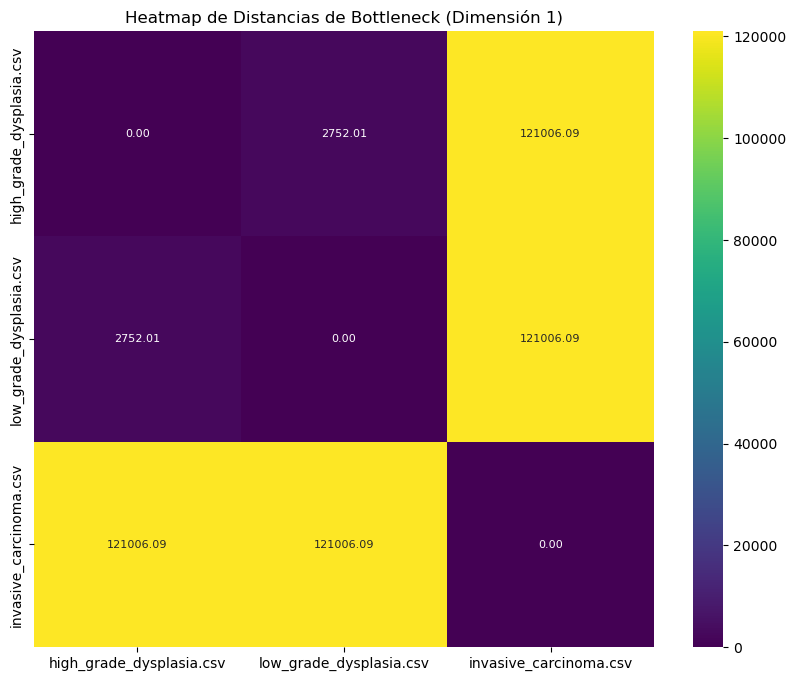

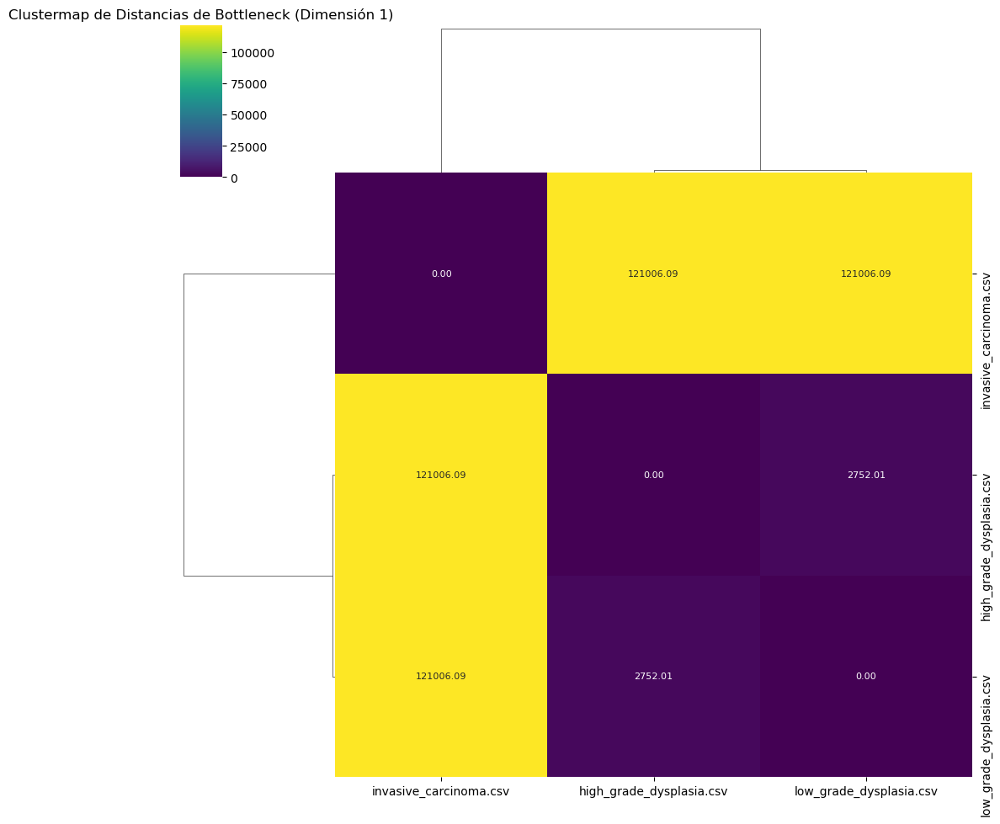

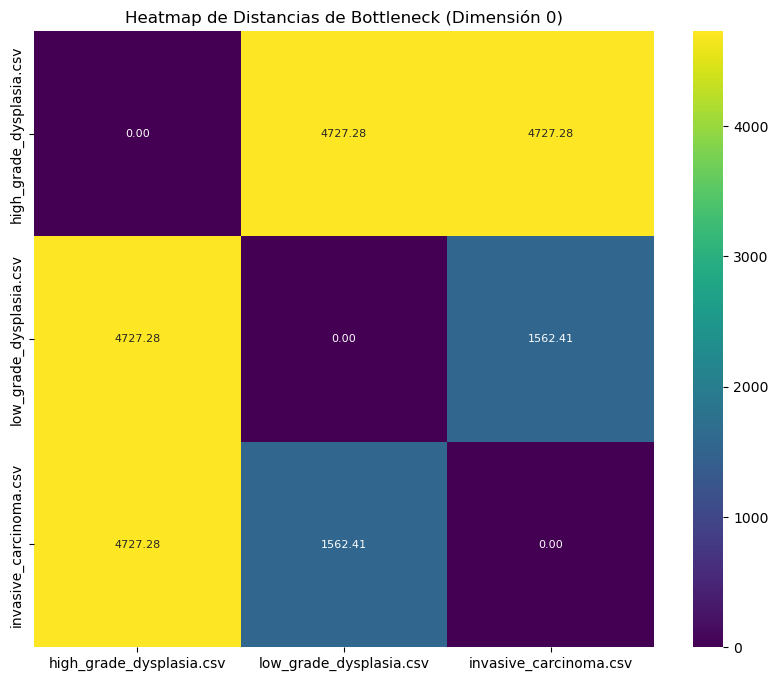

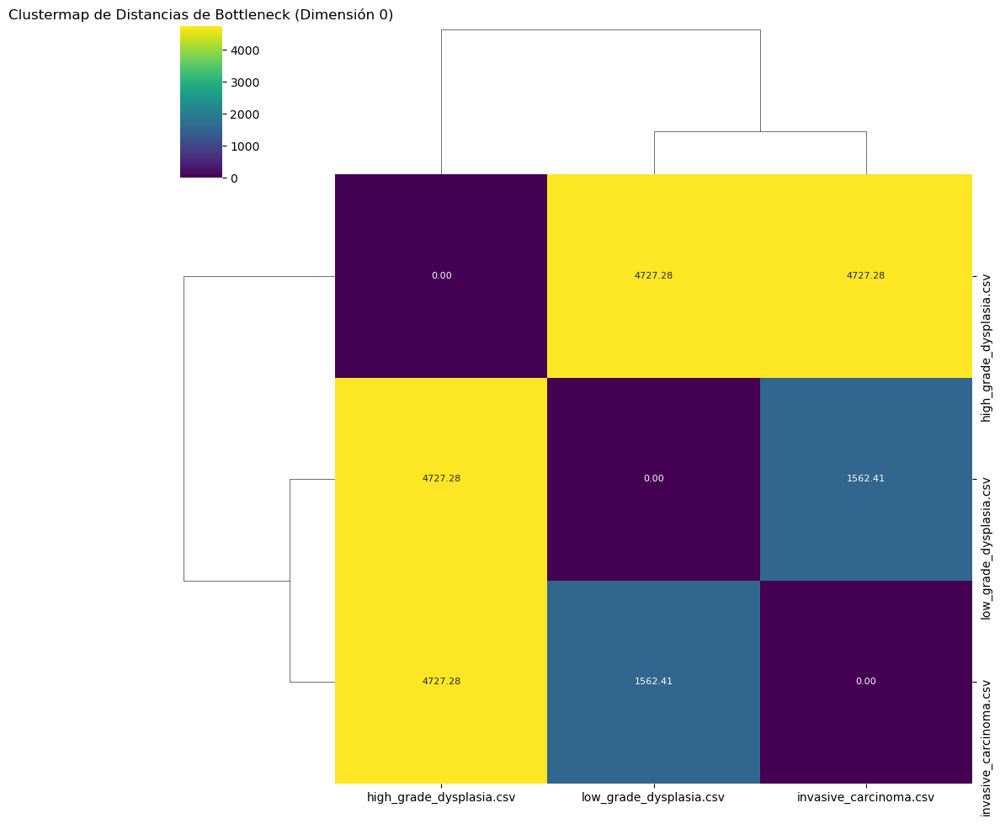

In [19]:
plot_heatmap_and_clustermap(distancias_dim1, "Distancias de Bottleneck (Dimensión 1)")
plot_heatmap_and_clustermap(distancias_dim0, "Distancias de Bottleneck (Dimensión 0)")